<a href="https://colab.research.google.com/github/kamrulhuda/Time_Series_Analysis/blob/main/LG_Data_Visualization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Link to video explaining the code below  https://www.youtube.com/watch?v=MngVV_4l9Po

In [44]:
!pip install pymatreader
from pymatreader import read_mat
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import os
from datetime import datetime
import pandas as pd
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

mpl.rcParams['figure.figsize'] = (10, 8)
mpl.rcParams['axes.grid'] = False


**Concatanating 8 mixed drive cycle + Sampling of Traing Data + Time series Decomposition**

In [45]:
#from google.colab import files
#uploaded = files.upload()

In [46]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Fri May 28 19:51:13 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 465.19.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   33C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [47]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('To enable a high-RAM runtime, select the Runtime > "Change runtime type"')
  print('menu, and then select High-RAM in the Runtime shape dropdown. Then, ')
  print('re-execute this cell.')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 27.3 gigabytes of available RAM

You are using a high-RAM runtime!


In [64]:
Charge6 = read_mat('10-29-18_11.15 551_Charge6.mat')
Charge6_df= pd.DataFrame(Charge6['meas'])

SOC=[]
for i in Charge6_df.index:
   x= 1 - Charge6_df['Ah'].values[-i]/3
   SOC.append(x)
#print(SOC)
Charge6_df['SOC']= SOC
Charge6_df = Charge6_df.iloc[1: , :]

#Creating the Dataframe for Mixed 1 drive cycle
Mixed1_25degC = read_mat('10-29-18_14.41 551_Mixed1_25degC_LGHG2.mat')
Mixed1_25degC_df= pd.DataFrame(Mixed1_25degC['meas'])

#Calculating SOC: In case of Discahrge test, initial SOC is 100%
Mixed1_25degC_df['SOC']= 1+ (Mixed1_25degC_df['Ah']/3)


#Creating the Dataframe for Charge 7 cycle
Charge7 = read_mat('10-29-18_16.50 551_Charge7.mat')
Charge7_df= pd.DataFrame(Charge6['meas'])

#Calculating SOC: In case of cahrge test, final SOC is 100%
SOC=[]
for i in Charge7_df.index:
   x= 1 - Charge7_df['Ah'].values[-i]/3
   SOC.append(x)
#print(SOC)
Charge7_df['SOC']= SOC
Charge7_df = Charge7_df.iloc[1: , :]

#Creating the Dataframe for Mixed 1 drive cycle
Mixed2_25degC = read_mat('10-29-18_20.16 551_Mixed2_25degC_LGHG2.mat')
Mixed2_25degC_df= pd.DataFrame(Mixed2_25degC['meas'])

#Resampling to 1 HZ
#Mixed2_25degC_df ['TimeStamp'] = pd.to_datetime(Mixed2_25degC_df['TimeStamp'])
#Mixed2_25degC_df.groupby(['Ah']).resample('1000L',on='TimeStamp').mean()

#Calculating SOC: In case of Discahrge test, initial SOC is 100%
Mixed2_25degC_df['SOC']= 1+(Mixed2_25degC_df['Ah']/3)

##########################################################################################################
Charge8 = read_mat('10-29-18_22.29 551_Charge8.mat')
Charge8_df= pd.DataFrame(Charge8['meas'])

SOC=[]
for i in Charge8_df.index:
   x= 1 - Charge8_df['Ah'].values[-i]/3
   SOC.append(x)
#print(SOC)
Charge8_df['SOC']= SOC
Charge8_df = Charge8_df.iloc[1: , :]

#Creating the Dataframe for Mixed 1 drive cycle
Cap_1C_25degC = read_mat('10-30-18_01.54 552_Cap_1C_25degC_LGHG2.mat')
Cap_1C_25degC_df= pd.DataFrame(Cap_1C_25degC['meas'])

#Calculating SOC: In case of Discahrge test, initial SOC is 100%
Cap_1C_25degC_df['SOC']= 1+ (Cap_1C_25degC_df['Ah']/3)


#Creating the Dataframe for Charge 7 cycle
Charge9 = read_mat('10-30-18_03.00 552_Charge9.mat')
Charge9_df= pd.DataFrame(Charge9['meas'])


#Calculating SOC: In case of cahrge test, final SOC is 100%
SOC=[]
for i in Charge9_df.index:
   x= 1 - Charge9_df['Ah'].values[-i]/3
   SOC.append(x)
#print(SOC)
Charge9_df['SOC']= SOC
Charge9_df = Charge9_df.iloc[1: , :]

#Creating the Dataframe for Mixed 1 drive cycle
Mixed3_25degC = read_mat('10-30-18_06.27 552_Mixed3_25degC_LGHG2.mat')
Mixed3_25degC_df= pd.DataFrame(Mixed3_25degC['meas'])

#Resampling to 1 HZ
#Mixed2_25degC_df ['TimeStamp'] = pd.to_datetime(Mixed2_25degC_df['TimeStamp'])
#Mixed2_25degC_df.groupby(['Ah']).resample('1000L',on='TimeStamp').mean()

#Calculating SOC: In case of Discahrge test, initial SOC is 100%
Mixed3_25degC_df['SOC']= 1+(Mixed3_25degC_df['Ah']/3)



################################################################################
Charge10 = read_mat('10-30-18_08.31 552_Charge10.mat')
Charge10_df= pd.DataFrame(Charge10['meas'])

SOC=[]
for i in Charge10_df.index:
   x= 1 - Charge6_df['Ah'].values[-i]/3
   SOC.append(x)
#print(SOC)
Charge10_df['SOC']= SOC
Charge10_df = Charge10_df.iloc[1: , :]

#Creating the Dataframe for Mixed 1 drive cycle
Mixed4_25degC = read_mat('10-30-18_11.56 552_Mixed4_25degC_LGHG2.mat')
Mixed4_25degC_df= pd.DataFrame(Mixed4_25degC['meas'])

#Calculating SOC: In case of Discahrge test, initial SOC is 100%
Mixed4_25degC_df['SOC']= 1+ (Mixed4_25degC_df['Ah']/3)


#Creating the Dataframe for Charge 7 cycle
Charge11 = read_mat('10-30-18_14.12 552_Charge11.mat')
Charge11_df= pd.DataFrame(Charge11['meas'])


#Calculating SOC: In case of cahrge test, final SOC is 100%
SOC=[]
for i in Charge11_df.index:
   x= 1 - Charge11_df['Ah'].values[-i]/3
   SOC.append(x)
#print(SOC)
Charge11_df['SOC']= SOC
Charge11_df = Charge11_df.iloc[1: , :]

#Creating the Dataframe for Mixed 1 drive cycle
Mixed5_25degC = read_mat('10-30-18_17.36 552_Mixed5_25degC_LGHG2.mat')
Mixed5_25degC_df= pd.DataFrame(Mixed5_25degC['meas'])

#Resampling to 1 HZ
#Mixed2_25degC_df ['TimeStamp'] = pd.to_datetime(Mixed2_25degC_df['TimeStamp'])
#Mixed2_25degC_df.groupby(['Ah']).resample('1000L',on='TimeStamp').mean()

#Calculating SOC: In case of Discahrge test, initial SOC is 100%
Mixed5_25degC_df['SOC']= 1+(Mixed5_25degC_df['Ah']/3)



###########################################################################
Charge12 = read_mat('10-30-18_19.38 552_Charge12.mat')
Charge12_df= pd.DataFrame(Charge12['meas'])

SOC=[]
for i in Charge12_df.index:
   x= 1 - Charge12_df['Ah'].values[-i]/3
   SOC.append(x)
#print(SOC)
Charge12_df['SOC']= SOC
Charge12_df = Charge12_df.iloc[1: , :]

#Creating the Dataframe for Mixed 1 drive cycle
Mixed6_25degC = read_mat('10-30-18_23.02 552_Mixed6_25degC_LGHG2.mat')
Mixed6_25degC_df= pd.DataFrame(Mixed6_25degC['meas'])

#Calculating SOC: In case of Discahrge test, initial SOC is 100%
Mixed6_25degC_df['SOC']= 1+ (Mixed6_25degC_df['Ah']/3)


#Creating the Dataframe for Charge 7 cycle
Charge13 = read_mat('10-31-18_01.13 552_Charge13.mat')
Charge13_df= pd.DataFrame(Charge13['meas'])


#Calculating SOC: In case of cahrge test, final SOC is 100%
SOC=[]
for i in Charge13_df.index:
   x= 1 - Charge13_df['Ah'].values[-i]/3
   SOC.append(x)
#print(SOC)
Charge13_df['SOC']= SOC
Charge13_df = Charge13_df.iloc[1: , :]

#Creating the Dataframe for Mixed 1 drive cycle
Mixed7_25degC = read_mat('10-31-18_04.38 552_Mixed7_25degC_LGHG2.mat')
Mixed7_25degC_df= pd.DataFrame(Mixed7_25degC['meas'])

#Resampling to 1 HZ
#Mixed2_25degC_df ['TimeStamp'] = pd.to_datetime(Mixed2_25degC_df['TimeStamp'])
#Mixed2_25degC_df.groupby(['Ah']).resample('1000L',on='TimeStamp').mean()

#Calculating SOC: In case of Discahrge test, initial SOC is 100%
Mixed7_25degC_df['SOC']= 1+(Mixed7_25degC_df['Ah']/3)




###########################################################################
Charge14 = read_mat('10-31-18_06.41 552_Charge14.mat')
Charge14_df= pd.DataFrame(Charge14['meas'])

SOC=[]
for i in Charge14_df.index:
   x= 1 - Charge14_df['Ah'].values[-i]/3
   SOC.append(x)
#print(SOC)
Charge14_df['SOC']= SOC
Charge14_df = Charge14_df.iloc[1: , :]

#Creating the Dataframe for Mixed 1 drive cycle
Mixed8_25degC = read_mat('10-31-18_10.05 552_Mixed8_25degC_LGHG2.mat')
Mixed8_25degC_df= pd.DataFrame(Mixed8_25degC['meas'])

#Calculating SOC: In case of Discahrge test, initial SOC is 100%
Mixed8_25degC_df['SOC']= 1+ (Mixed8_25degC_df['Ah']/3)


#Creating the Dataframe for Charge 7 cycle
Charge15 = read_mat('10-31-18_12.30 552_Charge15.mat')
Charge15_df= pd.DataFrame(Charge15['meas'])


#Calculating SOC: In case of cahrge test, final SOC is 100%
SOC=[]
for i in Charge15_df.index:
   x= 1 - Charge15_df['Ah'].values[-i]/3
   SOC.append(x)
#print(SOC)
Charge15_df['SOC']= SOC
Charge15_df = Charge15_df.iloc[1: , :]

#Creating the Dataframe for Mixed 1 drive cycle
PausCycl_25degC = read_mat('10-31-18_15.54 552_PausCycl_25degC_LGHG2.mat')
PausCycl_25degC_df= pd.DataFrame(PausCycl_25degC['meas'])

#Resampling to 1 HZ
#Mixed2_25degC_df ['TimeStamp'] = pd.to_datetime(Mixed2_25degC_df['TimeStamp'])
#Mixed2_25degC_df.groupby(['Ah']).resample('1000L',on='TimeStamp').mean()

#Calculating SOC: In case of Discahrge test, initial SOC is 100%
PausCycl_25degC_df['SOC']= 1+(PausCycl_25degC_df['Ah']/3)


#Creating the Dataframe for Charge 7 cycle
Charge16 = read_mat('10-31-18_17.41 552_Charge16.mat')
Charge16_df= pd.DataFrame(Charge16['meas'])


#Calculating SOC: In case of cahrge test, final SOC is 100%
SOC=[]
for i in Charge16_df.index:
   x= 1 - Charge16_df['Ah'].values[-i]/3
   SOC.append(x)
#print(SOC)
Charge16_df['SOC']= SOC
Charge16_df = Charge7_df.iloc[1: , :]





In [75]:
train_data= [Charge6_df,Mixed1_25degC_df,Charge7_df,Mixed2_25degC_df,Charge8_df, Cap_1C_25degC_df  ,Charge9_df,Mixed3_25degC_df,Charge10_df,Mixed4_25degC_df,Charge11_df,Mixed5_25degC_df,Charge12_df,Mixed6_25degC_df,Charge13_df,Mixed7_25degC_df,Charge14_df,Mixed8_25degC_df,Charge15_df,PausCycl_25degC_df,Charge16_df]
train_data=pd.concat(train_data)
train_data['TimeStamp']= pd.to_datetime(train_data['TimeStamp'],infer_datetime_format=True)

In [50]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 686224 entries, 1 to 209
Data columns (total 9 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   Time               686224 non-null  float64       
 1   TimeStamp          686224 non-null  datetime64[ns]
 2   Voltage            686224 non-null  float64       
 3   Current            686224 non-null  float64       
 4   Ah                 686224 non-null  float64       
 5   Wh                 686224 non-null  uint8         
 6   Power              686224 non-null  float64       
 7   Battery_Temp_degC  686224 non-null  float64       
 8   SOC                686224 non-null  float64       
dtypes: datetime64[ns](1), float64(7), uint8(1)
memory usage: 47.8 MB


In [76]:
train_data[['Time','TimeStamp', 'Voltage', 'Current','Battery_Temp_degC', 'Ah', 'SOC']]

,Time,TimeStamp,Voltage,Current,Battery_Temp_degC,Ah,SOC
1,59.997995,2018-10-29 11:16:57,3.22734,0.0,23.87099,0.00000,0.130327
2,119.998997,2018-10-29 11:17:57,3.22835,0.0,23.87099,0.00000,0.130327
3,179.997002,2018-10-29 11:18:57,3.22919,0.0,23.87099,0.00000,0.130327
4,239.999000,2018-10-29 11:19:57,3.23003,0.0,23.87099,0.00000,0.130327
5,299.998996,2018-10-29 11:20:57,3.23071,0.0,23.87099,0.00000,0.130327
...,...,...,...,...,...,...,...
205,12128.511000,2018-10-29 14:38:06,4.18596,0.0,23.66067,2.60902,1.000000
206,12188.510996,2018-10-29 14:39:06,4.18596,0.0,23.76583,2.60902,1.000000
207,12248.509001,2018-10-29 14:40:06,4.18596,0.0,23.97615,2.60902,1.000000
208,12308.508997,2018-10-29 14:41:06,4.18579,0.0,23.87099,2.60902,1.000000


array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f5d151eb7d0>,
      dtype=object)

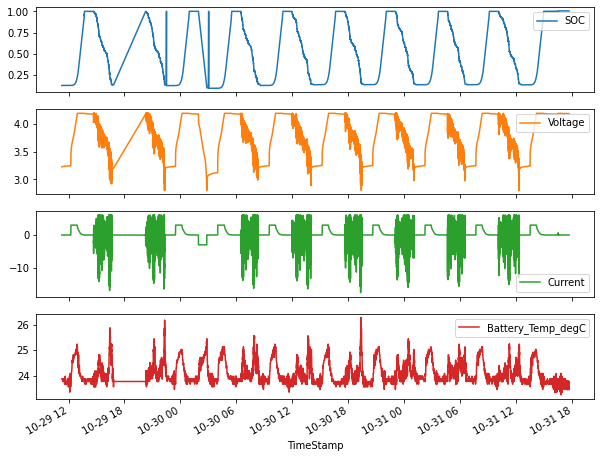

In [77]:
train_data.set_index('TimeStamp')[['SOC', 'Voltage', 'Current','Battery_Temp_degC']].plot(subplots=True)

In [78]:
print ("Rows     : " ,train_data.shape[0])
print ("Columns  : " ,train_data.shape[1])
print ("\nFeatures : \n" ,train_data.columns.tolist())
print ("\nMissing values :  ", train_data.isnull().any())
print ("\nUnique values :  \n",train_data.nunique())

Rows     :  686224
Columns  :  9

Features : 
 ['Time', 'TimeStamp', 'Voltage', 'Current', 'Ah', 'Wh', 'Power', 'Battery_Temp_degC', 'SOC']

Missing values :   Time                 False
TimeStamp            False
Voltage              False
Current              False
Ah                   False
Wh                   False
Power                False
Battery_Temp_degC    False
SOC                  False
dtype: bool

Unique values :  
 Time                 525672
TimeStamp             70612
Voltage               14278
Current                8005
Ah                   213610
Wh                        9
Power                422539
Battery_Temp_degC        30
SOC                  213192
dtype: int64


In [54]:
train_data.query('SOC != SOC') #to find the missing values

,Time,TimeStamp,Voltage,Current,Ah,Wh,Power,Battery_Temp_degC,SOC


In [55]:
#train_data['Voltage']=train_data['Voltage'].fillna(method='ffill')
#train_data['Current']=train_data['Current'].fillna(method='ffill')
#train_data['Battery_Temp_degC']=train_data['Battery_Temp_degC'].fillna(method='ffill')

In [56]:
print ("\nMissing values :  ", train_data.isnull().any())


Missing values :   Time                 False
TimeStamp            False
Voltage              False
Current              False
Ah                   False
Wh                   False
Power                False
Battery_Temp_degC    False
SOC                  False
dtype: bool


In [57]:
print(train_data.columns)

Index(['Time', 'TimeStamp', 'Voltage', 'Current', 'Ah', 'Wh', 'Power',
       'Battery_Temp_degC', 'SOC'],
      dtype='object')


In [80]:
train_data_sampled= train_data.resample('S', on='TimeStamp').mean()
train_data = train_data_sampled.interpolate(method='linear')

In [81]:
print(train_data.columns)

Index(['Time', 'Voltage', 'Current', 'Ah', 'Wh', 'Power', 'Battery_Temp_degC',
       'SOC'],
      dtype='object')


In [83]:
print(train_data)

                            Time   Voltage  ...  Battery_Temp_degC       SOC
TimeStamp                                   ...                             
2018-10-29 11:16:57    59.997995  3.227340  ...          23.870990  0.130327
2018-10-29 11:16:58    60.998012  3.227357  ...          23.870990  0.130327
2018-10-29 11:16:59    61.998028  3.227374  ...          23.870990  0.130327
2018-10-29 11:17:00    62.998045  3.227390  ...          23.870990  0.130327
2018-10-29 11:17:01    63.998062  3.227407  ...          23.870990  0.130327
...                          ...       ...  ...                ...       ...
2018-10-31 17:40:02  6306.468896  4.194560  ...          23.723766  1.005103
2018-10-31 17:40:03  6307.468096  4.194560  ...          23.660670  1.005103
2018-10-31 17:40:04  6308.469195  4.194560  ...          23.660670  1.005103
2018-10-31 17:40:05  6309.418443  4.194560  ...          23.660670  1.005103
2018-10-31 17:40:06  6310.043495  4.194560  ...          23.660670  1.005103

In [82]:
# Stack a scatter plot
fig = make_subplots(rows=4, shared_xaxes=True)

fig.add_scatter(y=train_data["SOC"], row=1, col=1) 
fig.add_scatter(y=train_data["Voltage"], row=2, col=1)
fig.add_scatter(y=train_data["Current"], row=3, col=1) 
fig.add_scatter(y=train_data["Battery_Temp_degC"], row=4, col=1) 

fig.show()

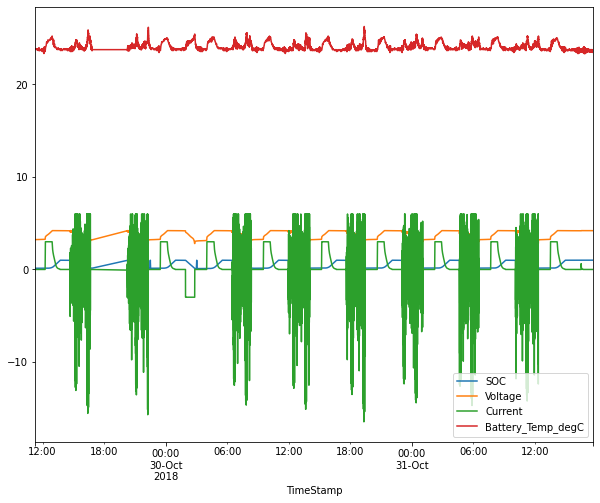

In [87]:
pd.concat([train_data['SOC'], train_data['Voltage'], train_data['Current'],train_data['Battery_Temp_degC']],axis=1).plot()

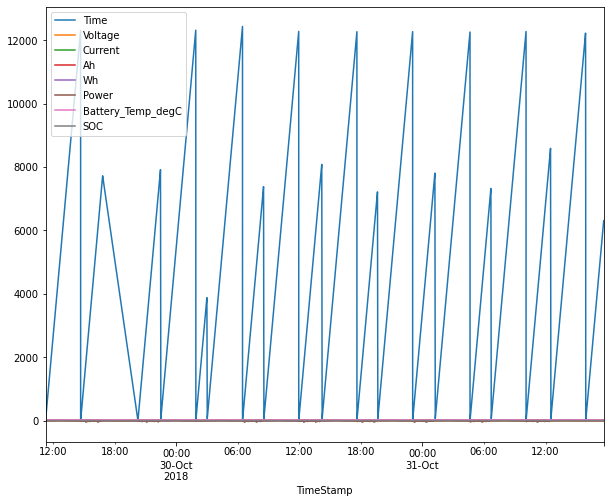

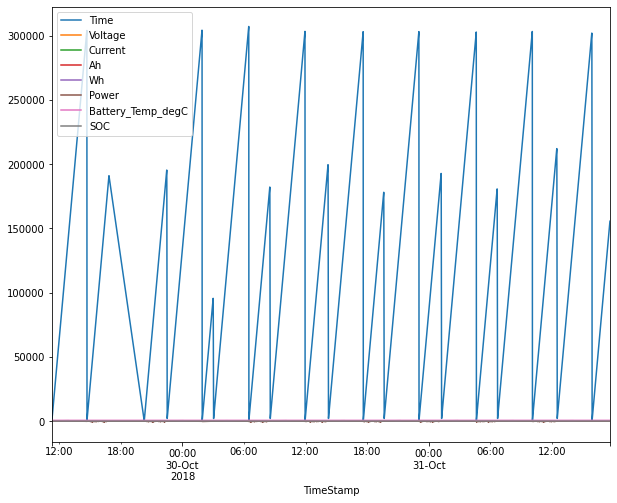

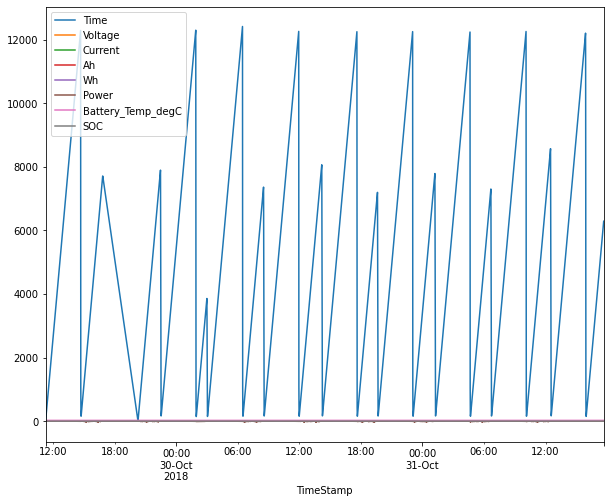

In [96]:
train_data.rolling(window=10).mean().plot()
train_data.rolling(window=50, win_type='gaussian').sum(std=10).plot()
train_data.ewm(span=50).mean().plot()

In [84]:
print(train_data)

                            Time   Voltage  ...  Battery_Temp_degC       SOC
TimeStamp                                   ...                             
2018-10-29 11:16:57    59.997995  3.227340  ...          23.870990  0.130327
2018-10-29 11:16:58    60.998012  3.227357  ...          23.870990  0.130327
2018-10-29 11:16:59    61.998028  3.227374  ...          23.870990  0.130327
2018-10-29 11:17:00    62.998045  3.227390  ...          23.870990  0.130327
2018-10-29 11:17:01    63.998062  3.227407  ...          23.870990  0.130327
...                          ...       ...  ...                ...       ...
2018-10-31 17:40:02  6306.468896  4.194560  ...          23.723766  1.005103
2018-10-31 17:40:03  6307.468096  4.194560  ...          23.660670  1.005103
2018-10-31 17:40:04  6308.469195  4.194560  ...          23.660670  1.005103
2018-10-31 17:40:05  6309.418443  4.194560  ...          23.660670  1.005103
2018-10-31 17:40:06  6310.043495  4.194560  ...          23.660670  1.005103

**Time Series Decompostion**

** Null Hypothesis: Data is Stationary
** Alternate: Data is not Stationary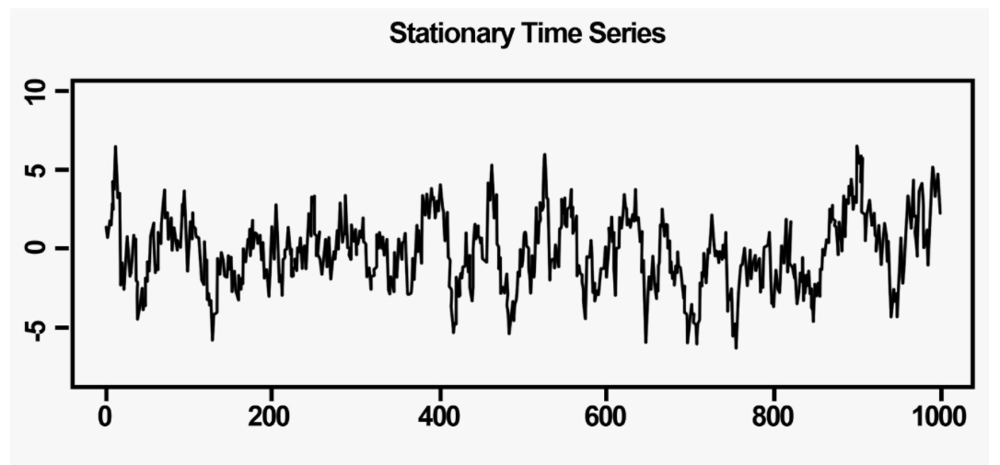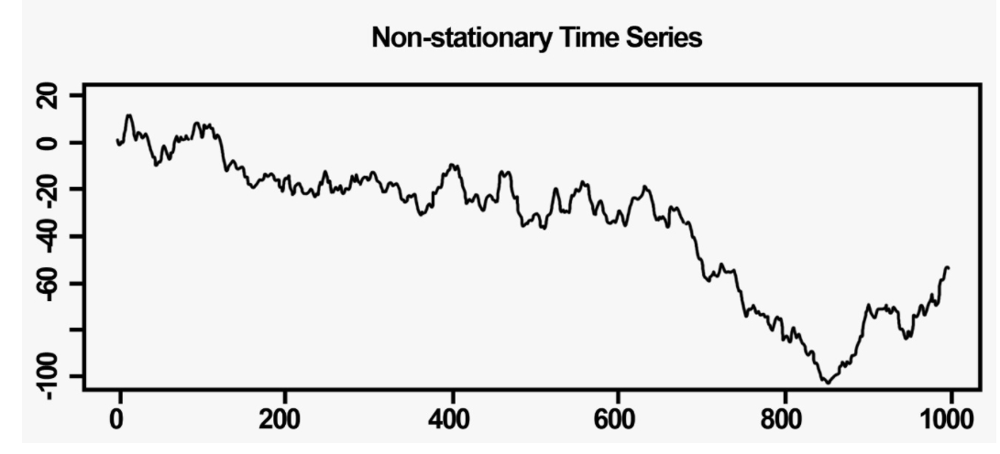

**KPPS Stationary Test**

In [101]:
from statsmodels.tsa.stattools import kpss
#tstest = kpss(train_data['Voltage'], 'ct')
#tstest
stats, p, lags, critical_values = kpss(train_data['Voltage'], 'c')

print(f'Test Statistics: {stats}')
print(f'p-value: {p}')
print(f'Critial Values: {critical_values}')

if p < 0.05 :
  print('Series is not Stationary')
else:
  print('Series is Stationary')

Test Statistics: 4.0580995189455
p-value: 0.01
Critial Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
Series is not Stationary


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1685: FutureWarning:

The behavior of using lags=None will change in the next release. Currently lags=None is the same as lags='legacy', and so a sample-size lag length is used. After the next release, the default will change to be the same as lags='auto' which uses an automatic lag length selection method. To silence this warning, either use 'auto' or 'legacy'

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1709: InterpolationWarning:

p-value is smaller than the indicated p-value



**ADF Stationary Test**

In [102]:
from statsmodels.tsa.stattools import adfuller
result = adfuller(train_data['Voltage'])

print(f'Test Statistics: {result[0]}')
print(f'p-value: {result[1]}')
print(f'Critial Values: {result[4]}')

if result[1] > 0.05 :
  print('Series is not Stationary')
else:
  print('Series is Stationary')

Test Statistics: -2.3218778337926733
p-value: 0.16500898297462208
Critial Values: {'1%': -3.430383413822421, '5%': -2.8615547684656057, '10%': -2.5667778607235894}
Series is not Stationary


KPSS test says that if the data is stationary or not. As P value= 0.01 which is less 0.5 threshold, so null hypothesis is rejected and thus DATA IS NOT STATIONRAY. Alternativly 2.96 statistical result is reater than 2.5%

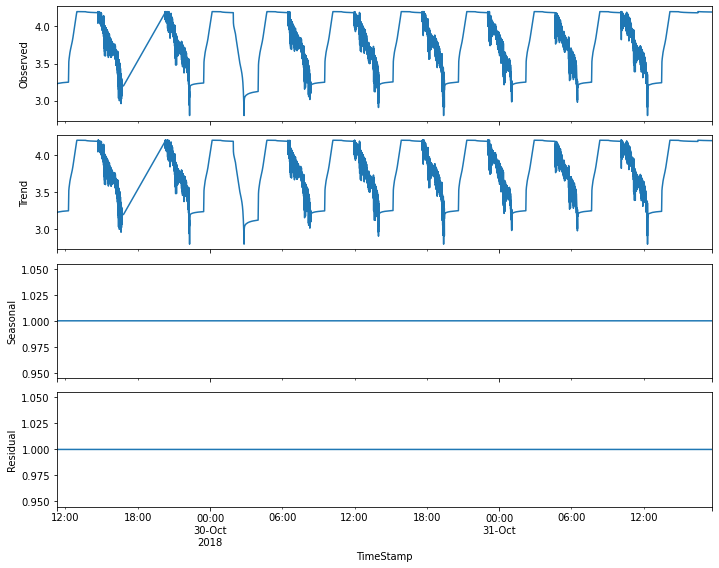

In [86]:
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
res = sm.tsa.seasonal_decompose(train_data['Voltage'],
                                model='multiplicative', freq=1)

resplot = res.plot()


In [2]:
#!pip install pmdarima

In [1]:
#import pmdarima as pm

#model = pm.auto_arima(train_data['Voltage'], 
                       # m=12, seasonal=True,
                     # start_p=0, start_q=0, max_order=4, test='adf',error_action='ignore',  
                           #suppress_warnings=True,
                      #stepwise=True, trace=True)

**Python Time Series Function**